In [0]:
from __future__ import print_function
from torchvision.datasets import utils
import torch.utils.data as data_utils
import torch
import os
import numpy as np
from torch import nn
from torch.nn.modules import upsampling
from torch.functional import F
from torch.optim import Adam
from scipy.io import loadmat
import numpy as np
import h5py 


%matplotlib inline


from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seem for reproducibility
#manualSeed = 999
manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  4219


In [0]:
# Root directory for dataset
dataroot = "./"

# Number of workers for dataloader
workers = 1

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 32

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 32

# Number of training epochs
num_epochs = 20

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [0]:
"""
def get_data_loader(dataset_location, batch_size):
    URL = "http://ufldl.stanford.edu/housenumbers/"
    # start processing
    def lines_to_np_array(lines):
        return np.array([[int(i) for i in line.split()] for line in lines])
    splitdata = []
    for splitname in ["train", "extra", "test"]:
        filename = "%s_32x32.mat" % splitname
        filepath = os.path.join(dataset_location, filename)
        utils.download_url(URL + filename, dataset_location)
        #print(filepath)
        f=loadmat(filepath)
        x = f["X"]#.readlines()
        print(x.shape)
        #f=h5py.File(filepath,'r')
        #with h5py.File(filepath,'r') as f:
        #with  loadmat(filepath) as f:
        #    lines = f.readlines()
        #x = lines_to_np_array(lines).astype('float32')
        #x = x.reshape(x.shape[3], 3, 32, 32)
        x=np.transpose(x, (3, 2,0,1))
        # pytorch data loader
        dataset = data_utils.TensorDataset(torch.from_numpy(x))
        dataset_loader = data_utils.DataLoader(x, batch_size=batch_size, shuffle=splitname == "train")
        splitdata.append(dataset_loader)
    return splitdata
  """

'\ndef get_data_loader(dataset_location, batch_size):\n    URL = "http://ufldl.stanford.edu/housenumbers/"\n    # start processing\n    def lines_to_np_array(lines):\n        return np.array([[int(i) for i in line.split()] for line in lines])\n    splitdata = []\n    for splitname in ["train", "extra", "test"]:\n        filename = "%s_32x32.mat" % splitname\n        filepath = os.path.join(dataset_location, filename)\n        utils.download_url(URL + filename, dataset_location)\n        #print(filepath)\n        f=loadmat(filepath)\n        x = f["X"]#.readlines()\n        print(x.shape)\n        #f=h5py.File(filepath,\'r\')\n        #with h5py.File(filepath,\'r\') as f:\n        #with  loadmat(filepath) as f:\n        #    lines = f.readlines()\n        #x = lines_to_np_array(lines).astype(\'float32\')\n        #x = x.reshape(x.shape[3], 3, 32, 32)\n        x=np.transpose(x, (3, 2,0,1))\n        # pytorch data loader\n        dataset = data_utils.TensorDataset(torch.from_numpy(x))\n  

In [0]:
dataset_location="SVHN"
URL = "http://ufldl.stanford.edu/housenumbers/"
    # start processing
data_name="train"#, "extra", "test"]:
filename = "%s_32x32.mat" % data_name
filepath = os.path.join(dataset_location, filename)
utils.download_url(URL + filename, dataset_location)
#print(filepath)
f=loadmat(filepath,mat_dtype=True)
#print(f)
x = f["X"].astype('float32')#.readlines()
#print(x.shape)
        #f=h5py.File(filepath,'r')
        #with h5py.File(filepath,'r') as f:
        #with  loadmat(filepath) as f:
        #    lines = f.readlines()
        #x = lines_to_np_array(lines).astype('float32')
        #x = x.reshape(x.shape[3], 3, 32, 32)
x=np.transpose(x, (3, 2,0,1))
x=x/256
print(x[0,0,0,1])
        # pytorch data loader
dataset= data_utils.TensorDataset(torch.from_numpy(x))
print(dataset)
dataloader= data_utils.DataLoader(dataset, batch_size=batch_size, shuffle=data_name == "train", num_workers=workers)
#        splitdata.append(dataset_loader)
#    return splitdata
  

Using downloaded and verified file: SVHN/train_32x32.mat
0.05859375


In [0]:
#train, valid, test = get_data_loader("SVHN", 512)

In [0]:
#import matplotlib
#import matplotlib.pyplot as plt
#%matplotlib inline
#for x in test:
#    print(x.shape)
#    plt.imshow(np.transpose(x[89], (1,2,0)))
#    break

torch.Size([64, 3, 32, 32])


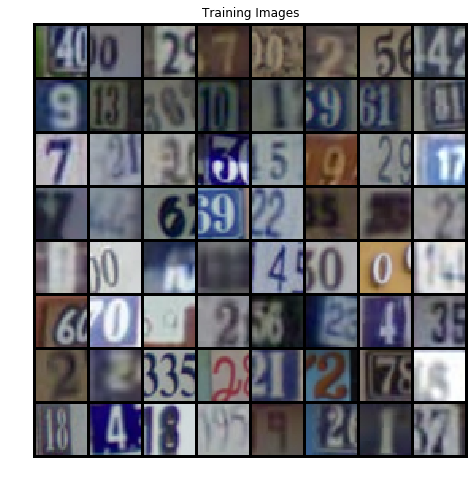

In [0]:

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


#print(datasetloader)
# Plot some training images
real_batch = next(iter(dataloader))
print(real_batch[0].shape)
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64].cpu() , padding=2),(1,2,0)))

In [0]:
"""
#Celebrity dataset
if not(os.path.isdir("img_align_celeba")):
  !pip install gdown
  !gdown https://drive.google.com/uc?id=0B7EVK8r0v71pZjFTYXZWM3FlRnM
  !unzip -q img_align_celeba.zip

# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset_cel = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader_cel= torch.utils.data.DataLoader(dataset_cel, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


#print(datasetloader)
# Plot some training images
real_batch = next(iter(dataloader_cel))
print(real_batch[0].shape)
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
"""

'\n#Celebrity dataset\nif not(os.path.isdir("img_align_celeba")):\n  !pip install gdown\n  !gdown https://drive.google.com/uc?id=0B7EVK8r0v71pZjFTYXZWM3FlRnM\n  !unzip -q img_align_celeba.zip\n\n# We can use an image folder dataset the way we have it setup.\n# Create the dataset\ndataset_cel = dset.ImageFolder(root=dataroot,\n                           transform=transforms.Compose([\n                               transforms.Resize(image_size),\n                               transforms.CenterCrop(image_size),\n                               transforms.ToTensor(),\n                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),\n                           ]))\n# Create the dataloader\ndataloader_cel= torch.utils.data.DataLoader(dataset_cel, batch_size=batch_size,\n                                         shuffle=True, num_workers=workers)\n\n# Decide which device we want to run on\ndevice = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "c

We use the tutorial provided in the pytorch website to help us implement our GAN :
https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

In [0]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            #nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            #nn.BatchNorm2d(ngf),
            #nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf*2, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [0]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


In [0]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            #nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            #nn.BatchNorm2d(ndf * 8),
            #nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [0]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(128, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)


In [0]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [0]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        #data=data.type('torch.DoubleTensor')
        real_cpu = (data[0]).to(device)#, dtype=torch.float32)|data[0].type('torch.FloatTensor')
        #print(real_cpu.type())
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/20][0/1145]	Loss_D: 1.6216	Loss_G: 0.9492	D(x): 0.4905	D(G(z)): 0.5702 / 0.4026
[0/20][50/1145]	Loss_D: 0.7198	Loss_G: 2.0365	D(x): 0.6956	D(G(z)): 0.2775 / 0.1327
[0/20][100/1145]	Loss_D: 0.4160	Loss_G: 3.3176	D(x): 0.8817	D(G(z)): 0.2460 / 0.0377
[0/20][150/1145]	Loss_D: 1.1656	Loss_G: 1.3292	D(x): 0.6221	D(G(z)): 0.4721 / 0.2847
[0/20][200/1145]	Loss_D: 1.0286	Loss_G: 1.1859	D(x): 0.5713	D(G(z)): 0.3575 / 0.3114
[0/20][250/1145]	Loss_D: 1.1429	Loss_G: 1.0700	D(x): 0.5046	D(G(z)): 0.3416 / 0.3512
[0/20][300/1145]	Loss_D: 1.1675	Loss_G: 1.3713	D(x): 0.5287	D(G(z)): 0.3759 / 0.2642
[0/20][350/1145]	Loss_D: 1.3878	Loss_G: 1.0169	D(x): 0.4819	D(G(z)): 0.4514 / 0.3707
[0/20][400/1145]	Loss_D: 1.0389	Loss_G: 1.6781	D(x): 0.6115	D(G(z)): 0.4022 / 0.2056
[0/20][450/1145]	Loss_D: 1.1924	Loss_G: 1.0951	D(x): 0.4551	D(G(z)): 0.3088 / 0.3421
[0/20][500/1145]	Loss_D: 1.0347	Loss_G: 1.3578	D(x): 0.5516	D(G(z)): 0.3165 / 0.2671
[0/20][550/1145]	Loss_D: 1.0944	Loss_G: 1.

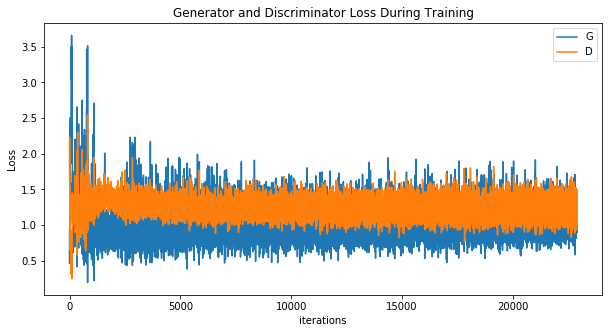

In [0]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

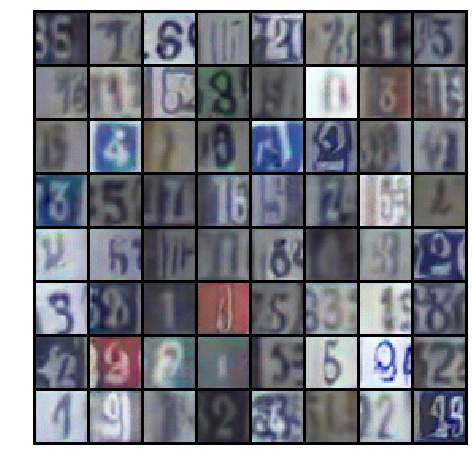

In [0]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

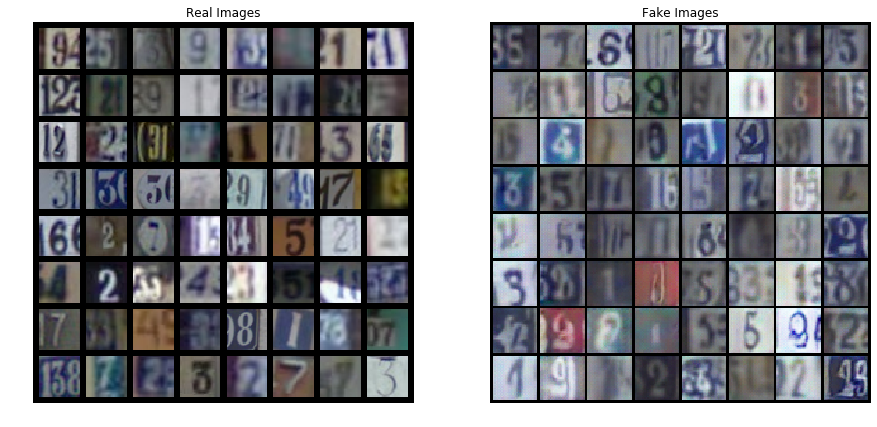

In [0]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

torch.Size([3, 274, 274])


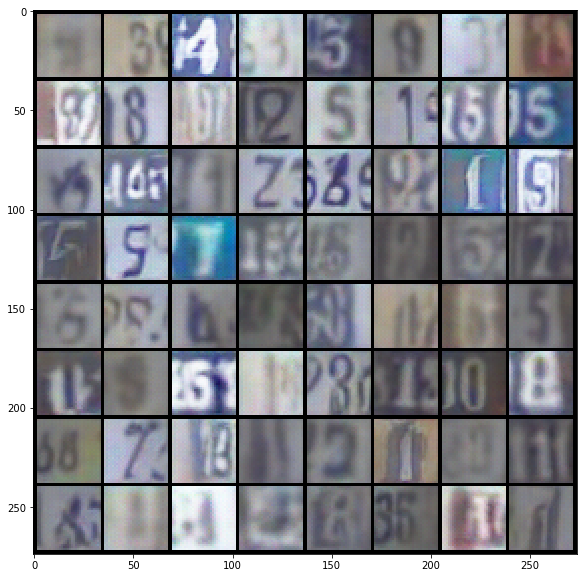

In [0]:
z=torch.randn(64, nz, 1, 1, device=device)
#img=model.decode(z)
fake = netG(z).detach().cpu()
fake=vutils.make_grid(fake, padding=2, normalize=True)
print(fake.shape)
plt.figure(figsize=(10,10))
plt.imshow(np.transpose(fake,(1,2,0)))

3.1.Provide visual samples (GAN)

In [0]:
import os
directory='GAN'
if not os.path.exists(directory):
    os.makedirs(directory)
    
Num_Img=1000
z=torch.randn(Num_Img, nz, 1, 1, device=device)
fake = netG(z).detach().cpu()
print(fake.shape)

for ii in range(Num_Img):
  save_path = './%s/fake_samples_epoch_%03d.png' % (directory,ii)
  vutils.save_image(fake.data[ii], save_path)
  
  

torch.Size([1000, 3, 32, 32])


In [0]:
import os
directory='GAN_64_64'
if not os.path.exists(directory):
    os.makedirs(directory)
    
epoch=100    
for ii in range(epoch):
  Num_Img=64
  z=torch.randn(Num_Img, nz, 1, 1, device=device)
  fake = netG(z).detach().cpu()
  fake=vutils.make_grid(fake, padding=2, normalize=True)
  #print(fake.shape)

  save_path = './%s/fake_samples_epoch_%03d.png' % (directory,ii)
  vutils.save_image(fake.data, save_path)

  

3.2.We want to see if the model has learned a disentangled representation in thelatent space.

In [0]:
import os
directory='GAN_Eps'
if not os.path.exists(directory):
    os.makedirs(directory)

Eps=3 #Change this parameter to assess interesting changes in generated samples
epoch=nz    
for ii in range(epoch):
  Num_Img=64
  z=torch.randn(Num_Img, nz, 1, 1, device=device)
  #Make small perturbationsto your sample z
  z[:,ii,:,:]=z[:,ii,:,:]+Eps
  fake = netG(z).detach().cpu()
  fake=vutils.make_grid(fake, padding=2, normalize=True)
  #print(fake.shape)

  save_path = './%s/fake_samples_dim_%03d.png' % (directory,ii)
  vutils.save_image(fake.data, save_path)

  

In [0]:
#generate figure for report
import os
directory='GAN_Eps2'
if not os.path.exists(directory):
    os.makedirs(directory)

epoch=nz    
Num_Img=8
z_org=torch.randn(Num_Img, nz, 1, 1, device=device)

for ii in range(100):
  #print('hiden Number:',ii)
  #fake_eps=[]
  fake_lst=[]
  #idx=1
  for Eps in [-5,-2,0,0.2,0.5,.8,1,3,5,20]:
    #Make small perturbationsto your sample z
    z=z_org
    z[:,ii,:,:]=z_org[:,ii,:,:]+Eps
    fake = netG(z).detach().cpu()
    fake_lst.append(fake)
    #print(fake.shape)
    
    

  fake=torch.stack(fake_lst)
  #print(fake.shape)
  #print(fake.shape)
  fake=fake.view(10*8,3,32,32)
  #print(fake3.shape)
  fake3=vutils.make_grid(fake, padding=2, normalize=True)

  save_path = './%s/fake3_samples_All_%2f_%d_.png' % (directory,Eps,ii)
  vutils.save_image(fake3.data, save_path)


3.3.Compare between interpolating in the data space and in the latent space.

In [0]:
#In the latent space
import os
directory='GAN_alpha'
if not os.path.exists(directory):
    os.makedirs(directory)
Num_Img=8
fake_lst=[]
z0=torch.randn(Num_Img, nz, 1, 1, device=device)
z1=torch.randn(Num_Img, nz, 1, 1, device=device)

for Alpha in [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
  
  z_alp=Alpha*z0+(1-Alpha)*z1

  fake = netG(z_alp).detach().cpu()
  fake_lst.append(fake)

fake=torch.stack(fake_lst)
print(fake.shape)
fake=fake.view(11*8,3,32,32)
#print(fake3.shape)
fake3=vutils.make_grid(fake, padding=2, normalize=True)

save_path = './%s/fake3_samples_All_alpha_%2f_laten.png' % (directory,Alpha)
vutils.save_image(fake3.data, save_path)



torch.Size([11, 8, 3, 32, 32])


In [0]:
# In the data space
import os
directory='GAN_alpha'
if not os.path.exists(directory):
    os.makedirs(directory)

fake_lst=[]
z0=torch.randn(Num_Img, nz, 1, 1, device=device)
z1=torch.randn(Num_Img, nz, 1, 1, device=device)


for Alpha in [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
  fake_z0 = netG(z0).detach().cpu()

  fake_z1 = netG(z1).detach().cpu()

  fake=Alpha*fake_z0+(1-Alpha)*fake_z1
  fake_lst.append(fake)

fake=torch.stack(fake_lst)
fake=fake.view(11*8,3,32,32)
#print(fake3.shape)
fake3=vutils.make_grid(fake, padding=2, normalize=True)

save_path = './%s/fake3_samples_All_alpha_%2f_data.png' % (directory,Alpha)
vutils.save_image(fake3.data, save_path)

